## **Overview of the document**
This document will consist of mainly two parts:
* Cross-state data analysis which will examine the question "Is the growth of clean energy production across states is connected to political affiliation of each state?"
* Plant-level energy production prediction using machine learning models (Expected October 2023).





## Cross-state data analysis
For cross-state analysis I want to investigate whether the fact that state is democrat/republican plays role in clean energy production growth over years 2015-2019.




### Theory
Clean energy production is of paramount importance in today's world, transcending political affiliations and ideologies. Its significance lies not only in mitigating the adverse effects of climate change but also in fostering economic growth, job creation, and energy security. The debate surrounding clean energy often intersects with political affiliations, with Democrats typically advocating for aggressive renewable energy policies, while Republicans may lean towards a more market-driven approach.

Therefore, this paper will investigate the link between a state's political party and its clean energy growth.

#### Model
\begin{equation}
\Delta \text{clean energy production} \substack{i, (2015-2019)} = \beta_0\substack{i} + \beta_1\substack{i} (\text{if_state_democrat}) + \beta_2 \substack{i} \text{gdp_growth}\substack{ (2015-2019)} + \beta_3\substack{i} \text{population_growth}\substack{(2015-2019)}+\beta_4 \substack{i} \text{gdp_growth}\substack{(2005-2009)} + \beta_5 \substack{i} \text{population_growth}\substack{(2005-2009)}+ ϵ\substack{i}
\end{equation}

#### Hypothesis
\begin{equation}
H\substack{0} : \beta_1 \neq 0
\end{equation}
\begin{equation}
H\substack{1} : \beta_1 = 0
\end{equation}

Therefore, this paper aims to investigate whether there exists a relationship between predominant political party affiliation of the state and its clean production energy growth between 2015 and 2019.

The model analyzes only presence of association rather than causality due to directionality problem (GDP and clean energy growth: two variables correlate and might actually have a causal relationship, but it’s difficult to conclude which variable causes changes in the other) and possible third variable problem (there exist more factors contributing to clean energy production growth outside the scope of this work).

### Data
To perform such regression analysis described above I would have to have a dataset with such column as state, whether it is blue/red, clean energy production over 2015-2019, gdp growth 2015-2019, population growth 2019-2019, gdp growth 2005-2009, and population growth 2005-2009.

So, let us construct this dataset step by step.

#### Step 0: Setting up and downloading libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, accuracy_score
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import mutual_info_regression

import pipes
from pipes import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#### Step 1: Plant dataset
First, let us get necessary information from plant dataset.

The dataset used is The Global Power Plant Database is an open-source open-access dataset of grid-scale (1 MW and greater) electricity generating facilities operating across the world. The Database currently contains nearly 35000 power plants in 167 countries, representing about 72% of the world's capacity.

To learn more about the dataset: https://github.com/wri/global-power-plant-database

In [143]:
#reading raw dataset
input_path =  '/content/drive/My Drive/Power_Generation_Project/'
df = pd.read_csv(input_path+"/global_power_plant_database.csv",low_memory=False)

In [146]:
#First, let limit plants only to those located in USA
usa=df[df['country'] == 'USA']

In [147]:
usa.shape

(9833, 36)

In [ ]:
#Next, let us keep columns relevant for the analysis
# To determine whether we should focus only on primary fuel let's see how many observations are missing for primary vs other fuels
print(usa['primary_fuel'].isna().sum())
print(usa['other_fuel1'].isna().sum())
print(usa['other_fuel2'].isna().sum())
print(usa['other_fuel3'].isna().sum())


0
8404
9564
9741


In [148]:
#Most observations are missing for other fuels so we will focus our analysis on the primary fuels
#But it is definitely worth mentioning as limitations
columns_keep=['country', 'name', 'gppd_idnr',
       'latitude', 'longitude', 'primary_fuel',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019']
usa1=usa[columns_keep]

In [149]:
#to get growth between 2015 and 2019 (5 year period we need to have these values)
print(usa1['generation_gwh_2019'].isna().sum())
print(usa1['generation_gwh_2015'].isna().sum())

174
2822


In [150]:
# Overall, we have almost 10,000 observations and in order to keep the analysis consistent, let us
# drop observations which have missing values for power generation in 2015 and 2019
usa1 = usa1.dropna(subset=["generation_gwh_2019", "generation_gwh_2015"])

In [151]:
# Now, let's investigate primary fuel column and classify it to clean energy or not
all_fuel_types=usa1['primary_fuel'].unique().tolist()
#Let's see what we have with the types of fuels not clearly classifiable
usa1[usa1['primary_fuel'] == 'Other'].shape
usa1[usa1['primary_fuel'] == 'Storage'].shape
usa1[usa1['primary_fuel'] == 'Cogeneration'].shape
#total we have 18 rows with other fuel type and the ones that do not generate but rather store energy
#so we will not include them in our analysis
clean_fuel=['Solar', 'Hydro', 'Wind', 'Biomass', 'Geothermal','Nuclear']
non_clean_fuel = set(all_fuel_types) - set(clean_fuel)-{"Storage"}
print(non_clean_fuel)

{'Waste', 'Gas', 'Other', 'Coal', 'Petcoke', 'Cogeneration', 'Oil'}


In [152]:
#creating binary column to correspond whether plant produces clean energy or not
def classify_clean_energy(primary_fuel):
    if primary_fuel in clean_fuel:
        return 1  # Clean energy
    elif primary_fuel in non_clean_fuel:
        return 0  # Non-clean energy
    else:
        return None  # Handle cases where primary_fuel is neither clean nor non-clean

usa1["if_clean"] = usa1["primary_fuel"].apply(classify_clean_energy)
usa1

,country,name,gppd_idnr,latitude,longitude,primary_fuel,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,if_clean
24713,USA,12 Applegate Solar LLC,USA0059371,40.2003,-74.5761,Solar,2.41461,2.35000,2.430000,2.492000,2.27600,2.207000,2.349000,1.0
24715,USA,1420 Coil Av #C,USA0057310,33.7943,-118.2414,Solar,1.52800,2.14900,1.515000,1.592000,1.66000,2.139000,1.781010,1.0
24716,USA,145 Talmadge Solar,USA0057458,40.5358,-74.3913,Solar,5.03600,4.52400,4.802000,5.051000,4.81900,4.626000,5.010000,1.0
24717,USA,1515 S Caron Road,USA0007770,41.9084,-89.0466,Gas,0.21500,0.17800,0.271000,0.306000,0.26400,0.272000,0.024000,0.0
24719,USA,180 Raritan Solar,USA0058187,40.5161,-74.3400,Solar,2.74100,2.58400,2.526000,2.659000,2.54700,2.386000,2.659000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34537,USA,Zion Energy Center,USA0055392,42.4776,-87.8950,Gas,0.00000,63.65600,132.434005,435.493999,0.00000,522.427997,597.390002,0.0
34538,USA,Zion Landfill Gas to Energy Facility,USA0056871,42.4803,-87.8861,Waste,43.59200,49.13400,46.699000,42.480000,38.66900,30.495000,22.647000,0.0
34539,USA,Zorn,USA0001368,38.2803,-85.7023,Gas,0.20300,0.07800,1.058000,0.062000,0.01500,-0.073000,-0.045000,0.0
34540,USA,Zotos International WPGF,USA0057648,42.8869,-76.9683,Wind,3.67100,2.46015,2.489000,1.670000,1.23349,2.630000,1.211000,1.0


In [ ]:
usa1["clean_2013"]=usa1['generation_gwh_2013']*usa1['if_clean']
usa1["nonclean_2013"]=usa1['generation_gwh_2013']*(1-usa1['if_clean'])
usa1["clean_2019"]=usa1['generation_gwh_2019']*usa1['if_clean']
usa1["nonclean_2019"]=usa1['generation_gwh_2019']*(1-usa1['if_clean'])
usa1

,country,name,gppd_idnr,latitude,longitude,primary_fuel,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,if_clean,clean_2013,nonclean_2013,clean_2019,nonclean_2019
24713,USA,12 Applegate Solar LLC,USA0059371,40.2003,-74.5761,Solar,2.41461,2.35000,2.430000,2.492000,2.27600,2.207000,2.349000,1.0,2.41461,0.000,2.34900,0.000000
24715,USA,1420 Coil Av #C,USA0057310,33.7943,-118.2414,Solar,1.52800,2.14900,1.515000,1.592000,1.66000,2.139000,1.781010,1.0,1.52800,0.000,1.78101,0.000000
24716,USA,145 Talmadge Solar,USA0057458,40.5358,-74.3913,Solar,5.03600,4.52400,4.802000,5.051000,4.81900,4.626000,5.010000,1.0,5.03600,0.000,5.01000,0.000000
24717,USA,1515 S Caron Road,USA0007770,41.9084,-89.0466,Gas,0.21500,0.17800,0.271000,0.306000,0.26400,0.272000,0.024000,0.0,0.00000,0.215,0.00000,0.024000
24719,USA,180 Raritan Solar,USA0058187,40.5161,-74.3400,Solar,2.74100,2.58400,2.526000,2.659000,2.54700,2.386000,2.659000,1.0,2.74100,0.000,2.65900,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34537,USA,Zion Energy Center,USA0055392,42.4776,-87.8950,Gas,0.00000,63.65600,132.434005,435.493999,0.00000,522.427997,597.390002,0.0,0.00000,0.000,0.00000,597.390002
34538,USA,Zion Landfill Gas to Energy Facility,USA0056871,42.4803,-87.8861,Waste,43.59200,49.13400,46.699000,42.480000,38.66900,30.495000,22.647000,0.0,0.00000,43.592,0.00000,22.647000
34539,USA,Zorn,USA0001368,38.2803,-85.7023,Gas,0.20300,0.07800,1.058000,0.062000,0.01500,-0.073000,-0.045000,0.0,0.00000,0.203,-0.00000,-0.045000
34540,USA,Zotos International WPGF,USA0057648,42.8869,-76.9683,Wind,3.67100,2.46015,2.489000,1.670000,1.23349,2.630000,1.211000,1.0,3.67100,0.000,1.21100,0.000000


In [ ]:
#Now we need to determine what state each plant is located at
#This function based on coordinates will determine the state
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="plant_locator")
def city_state_country(row):
    coord = f"{row['latitude']}, {row['longitude']}"
    location = geolocator.reverse(coord, exactly_one=True)
    address = location.raw['address']
    city = address.get('city', '')
    state = address.get('state', '')
    country = address.get('country', '')
    row['city'] = city
    row['state'] = state
    row['country'] = country
    return row

In [ ]:
usa2= usa1.apply(city_state_country, axis=1)

In [153]:
usa2.to_csv('/content/drive/My Drive/Power_Generation_Project/plants_with_states')

#### Step 2: Across-plant to across-state dataset

In [155]:
plants_states=pd.read_csv('/content/drive/My Drive/Power_Generation_Project/plants_with_states')

In [156]:
plants_states.columns

Index(['Unnamed: 0', 'country', 'name', 'gppd_idnr', 'latitude', 'longitude',
       'primary_fuel', 'generation_gwh_2013', 'generation_gwh_2014',
       'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017',
       'generation_gwh_2018', 'generation_gwh_2019', 'if_clean', 'clean_2013',
       'nonclean_2013', 'clean_2019', 'nonclean_2019', 'city', 'state'],
      dtype='object')

In [159]:
#First, we will group the plants by state and whether they produce clean energy or not
grouped = plants_states.groupby(['state', 'if_clean']).agg({
    'clean_2013': 'sum',
    'nonclean_2013': 'sum',
    'clean_2019': 'sum',
    'nonclean_2019': 'sum',
    'generation_gwh_2013': 'sum',
    'generation_gwh_2014': 'sum',
    'generation_gwh_2015': 'sum',
    'generation_gwh_2016': 'sum',
    'generation_gwh_2017': 'sum',
    'generation_gwh_2018': 'sum',
    'generation_gwh_2019': 'sum',
}).reset_index()
grouped['if_clean_0_count'] = grouped.groupby('state')['if_clean'].transform(lambda x: (x == 0).sum())
grouped['if_clean_1_count'] = grouped.groupby('state')['if_clean'].transform(lambda x: (x == 1).sum())
grouped

,state,if_clean,clean_2013,nonclean_2013,clean_2019,nonclean_2019,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,if_clean_0_count,if_clean_1_count
0,Alabama,0.0,0.000000,65867.984752,0.000000,83003.951826,65867.984752,59713.603832,66577.581745,55939.184135,53725.564991,56901.046069,83003.951826,1,1
1,Alabama,1.0,56442.145890,0.000000,58978.661833,0.000000,56442.145890,53469.359111,55146.172120,50616.878706,55031.470450,53480.704639,58978.661833,1,1
2,Alaska,0.0,0.000000,4730.819637,0.000000,4322.462186,4730.819637,3868.628116,3549.809048,3179.464508,3467.516604,3309.992153,4322.462186,1,1
3,Alaska,1.0,1554.810000,0.000000,1647.179000,0.000000,1554.810000,1657.328000,1697.970000,1701.067000,1624.042000,1650.134000,1647.179000,1,1
4,Arizona,0.0,0.000000,55913.086197,0.000000,56644.189691,55913.086197,42555.121427,49978.908181,47385.702431,41299.474327,45697.556002,56644.189691,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,West Virginia,1.0,2802.944000,0.000000,2930.023000,0.000000,2802.944000,2308.192000,2755.037000,3032.655000,3021.898000,3273.073000,2930.023000,1,1
99,Wisconsin,0.0,0.000000,29945.989512,0.000000,46813.252417,29945.989512,23761.065741,36481.770148,21306.019210,37168.153511,35113.968804,46813.252417,1,1
100,Wisconsin,1.0,14054.594236,0.000000,14717.118515,0.000000,14054.594236,14125.024476,14551.172989,15072.982194,14389.393556,14373.905900,14717.118515,1,1
101,Wyoming,0.0,0.000000,47184.491773,0.000000,36810.273706,47184.491773,44380.687429,44335.944373,41286.898488,41289.076388,41061.422948,36810.273706,1,1


In [160]:
#counting number of plants per state
number_plants_by_state = plants_states.groupby('state')['gppd_idnr'].count().reset_index()
clean_plants_by_state = plants_states[plants_states['if_clean'] == 1].groupby('state')['if_clean'].count().reset_index()
clean_plants_by_state

,state,if_clean
0,Alabama,35
1,Alaska,29
2,Arizona,66
3,Arkansas,26
4,California,767
5,Colorado,95
6,Connecticut,17
7,Delaware,7
8,District of Columbia,1
9,Florida,23


In [161]:
#new columns on power generation
grouped["clean_2014"]=grouped['generation_gwh_2014']*grouped['if_clean']
grouped["nonclean_2014"]=grouped['generation_gwh_2014']*(1-grouped['if_clean'])
grouped["clean_2015"]=grouped['generation_gwh_2015']*grouped['if_clean']
grouped["nonclean_2015"]=grouped['generation_gwh_2015']*(1-grouped['if_clean'])
grouped["clean_2016"]=grouped['generation_gwh_2016']*grouped['if_clean']
grouped["nonclean_2016"]=grouped['generation_gwh_2016']*(1-grouped['if_clean'])
grouped["clean_2017"]=grouped['generation_gwh_2017']*grouped['if_clean']
grouped["nonclean_2017"]=grouped['generation_gwh_2017']*(1-grouped['if_clean'])
grouped["clean_2018"]=grouped['generation_gwh_2018']*grouped['if_clean']
grouped["nonclean_2018"]=grouped['generation_gwh_2018']*(1-grouped['if_clean'])

In [162]:
#now grouping across state only
grouped= grouped.groupby(['state']).agg({
    'clean_2013': 'sum',
    'nonclean_2013': 'sum',
    'clean_2019': 'sum',
    'nonclean_2019': 'sum',
    'clean_2014': 'sum',
    'nonclean_2014': 'sum',
    'clean_2015': 'sum',
    'nonclean_2015': 'sum',
    'clean_2016': 'sum',
    'nonclean_2016': 'sum',
    'clean_2017': 'sum',
    'nonclean_2017': 'sum',
    'clean_2018': 'sum',
    'nonclean_2018': 'sum',
    'clean_2019': 'sum',
    'nonclean_2019': 'sum'
}).reset_index()

In [163]:
grouped.head(10)

,state,clean_2013,nonclean_2013,clean_2019,nonclean_2019,clean_2014,nonclean_2014,clean_2015,nonclean_2015,clean_2016,nonclean_2016,clean_2017,nonclean_2017,clean_2018,nonclean_2018
0,Alabama,56442.145890,65867.984752,58978.661833,83003.951826,53469.359111,59713.603832,55146.172120,66577.581745,50616.878706,55939.184135,55031.470450,53725.564991,53480.704639,56901.046069
1,Alaska,1554.810000,4730.819637,1647.179000,4322.462186,1657.328000,3868.628116,1697.970000,3549.809048,1701.067000,3179.464508,1624.042000,3467.516604,1650.134000,3309.992153
2,Arizona,42531.503640,55913.086197,44490.356490,56644.189691,44328.853440,42555.121427,45199.517470,49978.908181,45448.225310,47385.702431,45018.530600,41299.474327,44055.537700,45697.556002
3,Arkansas,16482.784458,43586.349114,19391.142868,44227.762896,18261.264829,41484.891021,19196.411265,34375.560964,18680.112177,40240.766224,17360.061469,42044.205329,17443.104672,46719.355806
4,California,69742.851453,112159.088975,94581.463895,90083.964920,67368.143592,114353.164654,70887.558896,112474.018908,89475.603711,91552.111091,102022.944091,83950.747681,86889.616999,88105.637106
5,Colorado,8335.388470,42723.354056,10343.189760,42509.429930,9124.940700,43009.620308,9048.507280,41481.280399,11389.459060,41498.721843,11078.240030,40178.039985,10999.401000,41771.083944
6,Connecticut,17467.850050,8197.170187,17167.412280,18689.779695,16279.756420,8383.731501,17717.025100,18541.097003,16815.210900,18872.945000,16836.202800,16727.662162,17437.043170,18310.145374
7,Delaware,49.185000,3220.522993,53.085010,5190.171972,52.865000,2094.519383,52.565390,7170.722009,55.075000,7809.673041,52.599260,3908.918666,50.436730,6185.648227
8,District of Columbia,0.000000,0.000000,55.128000,25.875380,0.000000,0.000000,0.000000,22.751000,52.801000,23.673000,0.000000,0.000000,0.000000,0.000000
9,Florida,35725.980292,128736.064443,36294.311198,197567.845209,36253.423462,113570.012175,37660.274169,115048.359816,38264.792521,117617.269484,36048.550099,144885.111513,37037.576521,126795.828802


#### Step 3: Political affiliation dataset
For the political affiliation information, I use information from https://www.statista.com/statistics/1080003/political-party-identification-state-us/
on political affiliation of each state in 2018.

The year 2018 is chosen as it seems to reflect the political image during the focus years of the study (2015-2019). Moreover, political affiliation is something that cannot change on 180 degrees over one night so 2018 trend might have been in place between 2015 and 2019.

In [164]:
political=pd.read_excel("/content/drive/My Drive/Power_Generation_Project/statistic_id1080003_us-political-party-identification-2018-by-state.xlsx")
political.head()


,State,Democrat/Lean Democrat,Republican/Lean Republican
0,Massachusetts,56,27
1,Vermont,55,30
2,Hawaii,54,29
3,Maryland,54,31
4,New York,53,30


In [165]:
#let's rename column for better convenience
political.columns=['state', 'democrat_support_proportion','republican_support_proportion']
political['if_democrat'] = political.apply(
    lambda row: 1 if row['democrat_support_proportion'] > row['republican_support_proportion'] else 0,
    axis=1
)
political

,state,democrat_support_proportion,republican_support_proportion,if_democrat
0,Massachusetts,56,27,1
1,Vermont,55,30,1
2,Hawaii,54,29,1
3,Maryland,54,31,1
4,New York,53,30,1
5,Connecticut,52,33,1
6,California,51,31,1
7,Illinois,50,34,1
8,New Jersey,50,35,1
9,Washington,50,35,1


#### Step 4: Population growth across states
Population growth data is taken from the national census.

In [106]:
population = pd.read_excel("/content/drive/My Drive/Power_Generation_Project/nst-est2019-01.xlsx", header=1)
population.head()

,state,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Alabama,4785437.0,4799069.0,4815588.0,4830081.0,4841799.0,4852347.0,4863525.0,4874486.0,4887681.0,4903185.0
1,Alaska,713910.0,722128.0,730443.0,737068.0,736283.0,737498.0,741456.0,739700.0,735139.0,731545.0
2,Arizona,6407172.0,6472643.0,6554978.0,6632764.0,6730413.0,6829676.0,6941072.0,7044008.0,7158024.0,7278717.0
3,Arkansas,2921964.0,2940667.0,2952164.0,2959400.0,2967392.0,2978048.0,2989918.0,3001345.0,3009733.0,3017804.0
4,California,37319502.0,37638369.0,37948800.0,38260787.0,38596972.0,38918045.0,39167117.0,39358497.0,39461588.0,39512223.0


In [166]:
#creating columns for gdp growth over 2015-2019 and 2010-2014
population["pop_growth_2015_2019"]=((population[2019]-population[2015])/population[2015])*100
population["pop_growth_2010_2014"]=((population[2014]-population[2010])/population[2010])*100
population.head()

,state,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,pop_growth_2015_2019,pop_growth_2010_2014
0,Alabama,4785437.0,4799069.0,4815588.0,4830081.0,4841799.0,4852347.0,4863525.0,4874486.0,4887681.0,4903185.0,1.047699,1.177782
1,Alaska,713910.0,722128.0,730443.0,737068.0,736283.0,737498.0,741456.0,739700.0,735139.0,731545.0,-0.807189,3.133868
2,Arizona,6407172.0,6472643.0,6554978.0,6632764.0,6730413.0,6829676.0,6941072.0,7044008.0,7158024.0,7278717.0,6.574851,5.044987
3,Arkansas,2921964.0,2940667.0,2952164.0,2959400.0,2967392.0,2978048.0,2989918.0,3001345.0,3009733.0,3017804.0,1.334968,1.554708
4,California,37319502.0,37638369.0,37948800.0,38260787.0,38596972.0,38918045.0,39167117.0,39358497.0,39461588.0,39512223.0,1.526742,3.423063


#### Step 5: GDP growth across states
GDP data is taken from US National Census.

In [167]:
gdp = pd.read_excel("/content/drive/My Drive/Power_Generation_Project/GDP_state.xlsx", header=5)
gdp.head()

/usr/local/lib/python3.10/dist-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,GeoFips,GeoName,1998,1999,2000,2001,2002,2003,2004,2005,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,00000,United States,9062817.0,9631172.0,10250952.0,10581929.0,10929108.0,11456450.0,12217196.0,13039197.0,...,16843196.0,17550687.0,18206023.0,18695106.0,19477337.0,20533058.0,21380976.0,21060474.0,23315081.0,25462722.0
1,01000,Alabama,110212.0,115680.1,119851.7,122915.5,127505.0,134152.6,147715.2,158846.8,...,194786.9,197406.9,202372.4,207368.4,214606.3,223859.3,231561.9,230892.1,254109.7,277817.5
2,02000,Alaska,24227.5,24744.3,26806.6,28494.1,29756.8,32037.9,35302.4,40356.6,...,57247.7,56484.9,51490.9,50727.7,53301.5,54899.6,54728.2,50475.2,57349.4,63618.0
3,04000,Arizona,143302.6,155755.8,165110.7,171909.6,180522.3,193634.9,206541.1,227915.9,...,278591.6,287666.6,299393.3,313081.4,332001.8,351879.5,372393.5,382072.3,420026.7,458949.8
4,05000,Arkansas,62396.7,66811.3,68678.5,70616.7,74113.9,78695.1,85199.6,90887.7,...,113227.3,116139.4,117786.8,119152.4,122466.7,127535.7,131578.3,133969.1,148676.1,165220.6


In [168]:
gdp["gdp_growth_2015_2019"]=((gdp["2019"]-gdp["2015"])/gdp["2015"])*100
gdp["gdp_growth_2010_2014"]=((gdp["2014"]-gdp["2010"])/gdp["2010"])*100
gdp.head()

,GeoFips,GeoName,1998,1999,2000,2001,2002,2003,2004,2005,...,2015,2016,2017,2018,2019,2020,2021,2022,gdp_growth_2015_2019,gdp_growth_2010_2014
0,00000,United States,9062817.0,9631172.0,10250952.0,10581929.0,10929108.0,11456450.0,12217196.0,13039197.0,...,18206023.0,18695106.0,19477337.0,20533058.0,21380976.0,21060474.0,23315081.0,25462722.0,17.439026,16.623842
1,01000,Alabama,110212.0,115680.1,119851.7,122915.5,127505.0,134152.6,147715.2,158846.8,...,202372.4,207368.4,214606.3,223859.3,231561.9,230892.1,254109.7,277817.5,14.423657,11.372520
2,02000,Alaska,24227.5,24744.3,26806.6,28494.1,29756.8,32037.9,35302.4,40356.6,...,51490.9,50727.7,53301.5,54899.6,54728.2,50475.2,57349.4,63618.0,6.287130,5.912630
3,04000,Arizona,143302.6,155755.8,165110.7,171909.6,180522.3,193634.9,206541.1,227915.9,...,299393.3,313081.4,332001.8,351879.5,372393.5,382072.3,420026.7,458949.8,24.382710,14.538389
4,05000,Arkansas,62396.7,66811.3,68678.5,70616.7,74113.9,78695.1,85199.6,90887.7,...,117786.8,119152.4,122466.7,127535.7,131578.3,133969.1,148676.1,165220.6,11.708867,14.438275


#### Step 6: Merging datasets
I merge datasets on "state" column.

In [169]:
# Merge the DataFrames based on the "state" column
merged_df = pd.merge(grouped, political, on='state', how='inner')
merged_df = pd.merge(merged_df, population, on="state", how="inner")
#renaming column to merge
gdp.rename(columns={'GeoName': 'state'}, inplace=True)
merged_df = pd.merge(merged_df, gdp, on="state", how="inner")
merged_df=pd.merge(merged_df, number_plants_by_state, on="state", how="inner")
merged_df=pd.merge(merged_df, clean_plants_by_state, on="state", how="inner")
merged_df.head()

,state,clean_2013,nonclean_2013,clean_2019,nonclean_2019,clean_2014,nonclean_2014,clean_2015,nonclean_2015,clean_2016,...,2017,2018,2019,2020,2021,2022,gdp_growth_2015_2019,gdp_growth_2010_2014,gppd_idnr,if_clean
0,Alabama,56442.145890,65867.984752,58978.661833,83003.951826,53469.359111,59713.603832,55146.172120,66577.581745,50616.878706,...,214606.3,223859.3,231561.9,230892.1,254109.7,277817.5,14.423657,11.372520,69,35
1,Alaska,1554.810000,4730.819637,1647.179000,4322.462186,1657.328000,3868.628116,1697.970000,3549.809048,1701.067000,...,53301.5,54899.6,54728.2,50475.2,57349.4,63618.0,6.287130,5.912630,133,29
2,Arizona,42531.503640,55913.086197,44490.356490,56644.189691,44328.853440,42555.121427,45199.517470,49978.908181,45448.225310,...,332001.8,351879.5,372393.5,382072.3,420026.7,458949.8,24.382710,14.538389,105,66
3,Arkansas,16482.784458,43586.349114,19391.142868,44227.762896,18261.264829,41484.891021,19196.411265,34375.560964,18680.112177,...,122466.7,127535.7,131578.3,133969.1,148676.1,165220.6,11.708867,14.438275,52,26
4,California,69742.851453,112159.088975,94581.463895,90083.964920,67368.143592,114353.164654,70887.558896,112474.018908,89475.603711,...,2728743.1,2897200.7,3042694.1,3020173.4,3373240.7,3598102.7,23.008908,19.507457,1104,767


In [170]:
#leaving only relevant columns
cols_regression=['state', 'clean_2013', 'nonclean_2013','clean_2019', 'nonclean_2019', 'clean_2014', 'nonclean_2014', 'clean_2015',
'nonclean_2015', 'clean_2016', 'nonclean_2016','clean_2017', 'nonclean_2017', 'clean_2018', 'nonclean_2018',
'democrat_support_proportion','republican_support_proportion','if_democrat','pop_growth_2015_2019',          'pop_growth_2010_2014',
'gdp_growth_2015_2019','gdp_growth_2010_2014', 'gppd_idnr',	'if_clean']
regression_df=merged_df[cols_regression]


In [171]:
#creating column of interest
regression_df["clean_energy_change"] = ((regression_df['clean_2019'] - regression_df['clean_2015']) / regression_df['clean_2015']) * 100

In [172]:
#renaming columns
regression_df.rename(columns={'gppd_idnr': 'total_plants', 'if_clean': 'clean_plants'}, inplace=True)

In [173]:
regression_df["ratio_clean_total"]=regression_df["clean_plants"]/regression_df["total_plants"]

In [174]:
regression_df.head()

,state,clean_2013,nonclean_2013,clean_2019,nonclean_2019,clean_2014,nonclean_2014,clean_2015,nonclean_2015,clean_2016,...,republican_support_proportion,if_democrat,pop_growth_2015_2019,pop_growth_2010_2014,gdp_growth_2015_2019,gdp_growth_2010_2014,total_plants,clean_plants,clean_energy_change,ratio_clean_total
0,Alabama,56442.145890,65867.984752,58978.661833,83003.951826,53469.359111,59713.603832,55146.172120,66577.581745,50616.878706,...,52,0,1.047699,1.177782,14.423657,11.372520,69,35,6.949693,0.507246
1,Alaska,1554.810000,4730.819637,1647.179000,4322.462186,1657.328000,3868.628116,1697.970000,3549.809048,1701.067000,...,51,0,-0.807189,3.133868,6.287130,5.912630,133,29,-2.991278,0.218045
2,Arizona,42531.503640,55913.086197,44490.356490,56644.189691,44328.853440,42555.121427,45199.517470,49978.908181,45448.225310,...,41,0,6.574851,5.044987,24.382710,14.538389,105,66,-1.568957,0.628571
3,Arkansas,16482.784458,43586.349114,19391.142868,44227.762896,18261.264829,41484.891021,19196.411265,34375.560964,18680.112177,...,48,0,1.334968,1.554708,11.708867,14.438275,52,26,1.014417,0.500000
4,California,69742.851453,112159.088975,94581.463895,90083.964920,67368.143592,114353.164654,70887.558896,112474.018908,89475.603711,...,31,1,1.526742,3.423063,23.008908,19.507457,1104,767,33.424631,0.694746


### Visualizations
To see trends and patterns of the data, let us visualize it.

#### Number of clean plants by 2019 VS Amount of clean energy produced in 2019

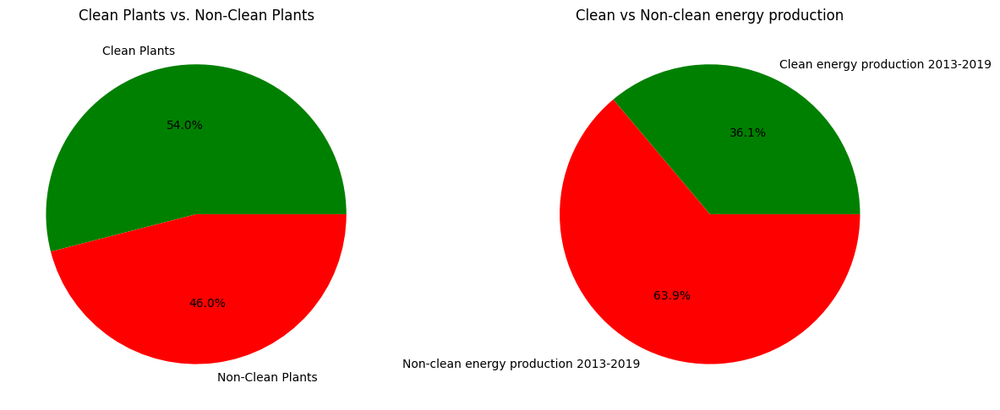

In [175]:
# Suppress the specific warning
import pandas as pd
# Disable the SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # 'warn' or 'raise' can be used to enable the warning

# Calculate values for the first pie chart
regression_df["non_clean_plants"]=regression_df["total_plants"]-regression_df["clean_plants"]
clean_plants =regression_df['clean_plants'].sum()
non_clean_plants = regression_df['non_clean_plants'].sum()

# Calculate values for the second pie chart
regression_df["total_clean_energy"]=regression_df['clean_2013']+regression_df['clean_2014']+regression_df['clean_2015']
+regression_df['clean_2016']+regression_df['clean_2017']+regression_df['clean_2018']+regression_df['clean_2019']
regression_df["total_nonclean_energy"]=regression_df['nonclean_2013']+regression_df['nonclean_2014']+regression_df['nonclean_2015']
+regression_df['nonclean_2016']+regression_df['nonclean_2017']+regression_df['nonclean_2018']+regression_df['nonclean_2019']

clean_total = regression_df['total_clean_energy'].sum()
non_clean_total = regression_df['total_nonclean_energy'].sum()

# Define custom colors (green and red)
colors = ['green', 'red']

# Create two side-by-side pie charts with custom colors
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# First pie chart: Clean Plants vs. Non-Clean Plants
axes[0].pie([clean_plants, non_clean_plants], labels=['Clean Plants', 'Non-Clean Plants'], autopct='%1.1f%%', colors=colors)
axes[0].set_title('Clean Plants vs. Non-Clean Plants')

# Second pie chart:
axes[1].pie([clean_total, non_clean_total], labels=['Clean energy production 2013-2019', 'Non-clean energy production 2013-2019'], autopct='%1.1f%%', colors=colors)
axes[1].set_title('Clean vs Non-clean energy production')

plt.tight_layout()
plt.show()

#### Proportion of clean vs non-clean energy production in democrat vs republican states

In [176]:
#creating new column for future convenience
regression_df["party"] = np.where(regression_df["if_democrat"] == 1, "Democrat", "Republican")

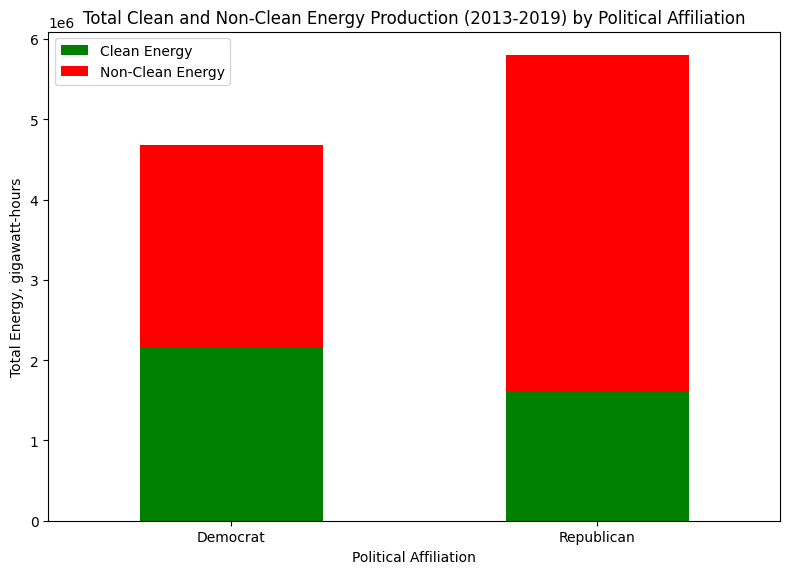

In [178]:
grouped_party = regression_df.groupby('party')[['total_clean_energy', 'total_nonclean_energy']].sum()
ax = grouped_party.plot(kind='bar', stacked=True, figsize=(8, 6), color=['green', 'red'])

#adding labels and title
ax.set_xlabel('Political Affiliation')
ax.set_ylabel('Total Energy, gigawatt-hours')
ax.set_title('Total Clean and Non-Clean Energy Production (2013-2019) by Political Affiliation')
ax.legend(['Clean Energy', 'Non-Clean Energy'])

ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.tight_layout()
plt.show()

#### Clean vs Non-clean energy production across states

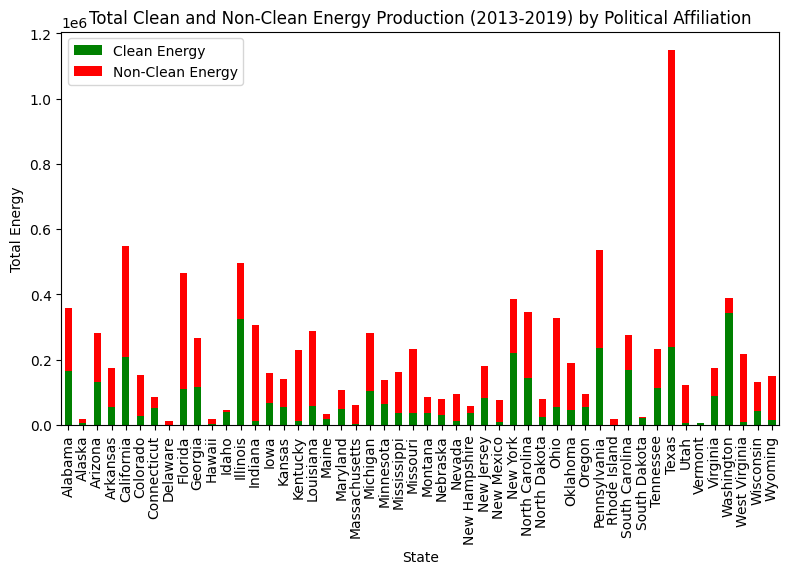

In [126]:
#setting "state" column as the index
regression_df=regression_df.set_index('state')

#creating bar chart with two bars and custom colors
ax = regression_df[['total_clean_energy', 'total_nonclean_energy']].plot(kind='bar', stacked=True, figsize=(8, 6), color=['green', 'red'])

#labels and title
ax.set_xlabel('State')
ax.set_ylabel('Total Energy')
ax.set_title('Total Clean and Non-Clean Energy Production (2013-2019) by Political Affiliation')
ax.legend(['Clean Energy', 'Non-Clean Energy'])

#turning states names by 90 degrees so they fit
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout()
plt.show()


#### Time trend across state vs USA

In [179]:
#creating columns for convenience
regression_df["total_energy_2013"]=regression_df["clean_2013"]+regression_df["nonclean_2013"]
regression_df["total_energy_2014"]=regression_df["clean_2014"]+regression_df["nonclean_2014"]
regression_df["total_energy_2015"]=regression_df["clean_2015"]+regression_df["nonclean_2015"]
regression_df["total_energy_2016"]=regression_df["clean_2016"]+regression_df["nonclean_2016"]
regression_df["total_energy_2017"]=regression_df["clean_2017"]+regression_df["nonclean_2017"]
regression_df["total_energy_2018"]=regression_df["clean_2018"]+regression_df["nonclean_2018"]
regression_df["total_energy_2019"]=regression_df["clean_2019"]+regression_df["nonclean_2019"]

In [180]:
#creating dataframe separately for democrat and republcian states
party_df = regression_df.groupby(['party']).agg({
    'clean_2013': 'sum',
    'nonclean_2013': 'sum',
    'clean_2019': 'sum',
    'nonclean_2019': 'sum',
    'clean_2014': 'sum',
    'nonclean_2014': 'sum',
    'clean_2015': 'sum',
    'nonclean_2015': 'sum',
    'clean_2016': 'sum',
    'nonclean_2016': 'sum',
    'clean_2017': 'sum',
    'nonclean_2017': 'sum',
    'clean_2018': 'sum',
    'nonclean_2018': 'sum',
}).reset_index()
#creating new column which represents proportion of clean energy as total energy produced
for year in range(2013, 2020):
    clean_col_name = f"clean_{year}"
    nonclean_col_name = f"nonclean_{year}"
    party_df[str(year)] = party_df[clean_col_name] / (party_df[clean_col_name] + party_df[nonclean_col_name])
party_df

,party,clean_2013,nonclean_2013,clean_2019,nonclean_2019,clean_2014,nonclean_2014,clean_2015,nonclean_2015,clean_2016,...,nonclean_2017,clean_2018,nonclean_2018,2013,2014,2015,2016,2017,2018,2019
0,Democrat,717300.637118,8.265458e+05,761324.486714,9.901463e+05,725387.162350,8.128810e+05,724585.135912,8.767531e+05,763600.438724,...,8.138643e+05,772229.979580,7.964055e+05,0.464619,0.471561,0.452487,0.474374,0.491283,0.492294,0.434677
1,Republican,530035.517831,1.391033e+06,599520.972635,1.450948e+06,536337.972252,1.375509e+06,555454.428417,1.416028e+06,568669.929666,...,1.251796e+06,581539.804647,1.299658e+06,0.275907,0.280534,0.281745,0.303958,0.313657,0.309133,0.292382


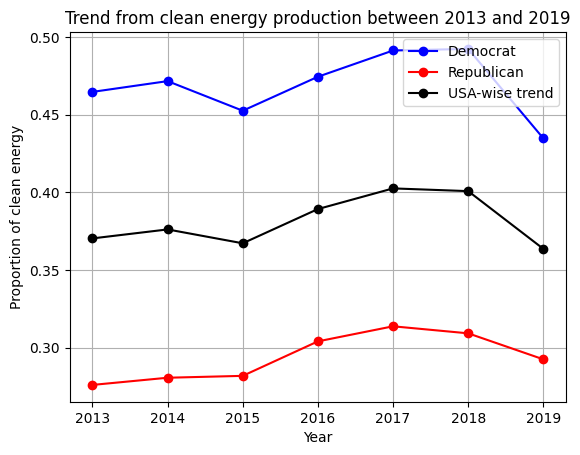

In [181]:
import matplotlib.pyplot as plt
years = list(range(2013, 2020))
#for overall trend
values = [party_df[str(year)].mean() for year in years]

#for "Democrat" party and plot its line in blue
democrat_values = [party_df[party_df['party'] == 'Democrat'][str(year)].mean() for year in years]
plt.plot(years, democrat_values, marker='o', linestyle='-', label='Democrat', color='blue')

#for "Republican" party and plot its line in red
republican_values = [party_df[party_df['party'] == 'Republican'][str(year)].mean() for year in years]
plt.plot(years, republican_values, marker='o', linestyle='-', label='Republican', color='red')

#ploting the USA-wise trend line in black
usa_wise_values = [value for value in values]
plt.plot(years, usa_wise_values, marker='o', linestyle='-', label='USA-wise trend', color='black')

plt.title('Trend from clean energy production between 2013 and 2019')
plt.xlabel('Year')
plt.ylabel('Proportion of clean energy')
plt.grid(True)
plt.legend()
plt.show()


#### Clean energy plants location state wise

In [74]:
!pip install folium

In [182]:
import folium
import pandas as pd

# Create a map centered on the USA
usa_map = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

for index, row in plants_states.iterrows():
    if_clean = row['if_clean']
    radius = 3

    # Get the latitude and longitude for the current row
    latitude = row['latitude']
    longitude = row['longitude']

    # Create a circle (dot) for each plant
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=radius,
        color='green' if if_clean else 'red',
        fill=True,
        fill_color='green' if if_clean else 'red',
        fill_opacity=0.5,
        popup=f"Clean: {if_clean}"
    ).add_to(usa_map)

# Save the map to an HTML file
usa_map.save("plant_locations.html")

# Display the map
usa_map


### Tables - Answers to most popular questions
Let us also answer some popular questions in form of dataframes.

#### Leaders in energy production and clean energy production

In [188]:
leaders=regression_df[["state", "total_clean_energy", "total_nonclean_energy", "party", 'republican_support_proportion']]
leaders["clean_energy_ratio"]=leaders["total_clean_energy"]/(leaders["total_clean_energy"]+leaders["total_nonclean_energy"])
leaders["total_energy_production"]=leaders["total_clean_energy"]+leaders["total_nonclean_energy"]

We see that leaders in the total energy production are Texas, California, Pennsylvania, Illinois, and Florida.

In [190]:
leaders = leaders.sort_values(by="total_energy_production", ascending=False)
leaders.head(10)

,state,total_clean_energy,total_nonclean_energy,party,republican_support_proportion,clean_energy_ratio,total_energy_production
42,Texas,239916.432365,908096.356373,Republican,42,0.208984,1.148013e+06
4,California,207998.553941,338986.272537,Democrat,31,0.380264,5.469848e+05
37,Pennsylvania,234388.641009,301812.918621,Democrat,40,0.437128,5.362016e+05
12,Illinois,323144.149840,174143.479232,Democrat,34,0.649813,4.972876e+05
8,Florida,109639.677923,357354.436434,Democrat,41,0.234777,4.669941e+05
46,Washington,343932.850446,44498.115262,Democrat,35,0.885441,3.884310e+05
31,New York,219837.168520,164578.739762,Democrat,30,0.571873,3.844159e+05
0,Alabama,165057.677121,192159.170329,Republican,52,0.462066,3.572168e+05
32,North Carolina,142516.575069,202354.131718,Republican,42,0.413246,3.448707e+05
34,Ohio,56054.396263,272399.349102,Republican,45,0.170661,3.284537e+05


Leaders by total clean energy prooduction volume-wise are Washington, Illinois, Texas, Pennsylvania, and New York.

In [132]:
leaders = leaders.sort_values(by="total_clean_energy", ascending=False)
leaders.head(10)

,total_clean_energy,total_nonclean_energy,party,republican_support_proportion,clean_energy_ratio,total_energy_production
state,,,,,,
Washington,343932.850446,44498.115262,Democrat,35,0.885441,3.884310e+05
Illinois,323144.149840,174143.479232,Democrat,34,0.649813,4.972876e+05
Texas,239916.432365,908096.356373,Republican,42,0.208984,1.148013e+06
Pennsylvania,234388.641009,301812.918621,Democrat,40,0.437128,5.362016e+05
New York,219837.168520,164578.739762,Democrat,30,0.571873,3.844159e+05
California,207998.553941,338986.272537,Democrat,31,0.380264,5.469848e+05
South Carolina,166991.461207,108958.527390,Republican,47,0.605151,2.759500e+05
Alabama,165057.677121,192159.170329,Republican,52,0.462066,3.572168e+05
North Carolina,142516.575069,202354.131718,Republican,42,0.413246,3.448707e+05


Leaders by clean to total energy ratio are South Dacota, Washington, Idaho, Vermont, and Illinois.

In [133]:
leaders = leaders.sort_values(by="clean_energy_ratio", ascending=False)
leaders.head(10)[["clean_energy_ratio", "party", 'republican_support_proportion']]

,clean_energy_ratio,party,republican_support_proportion
state,,,
South Dakota,0.924076,Republican,51
Washington,0.885441,Democrat,35
Idaho,0.871989,Republican,50
Vermont,0.870232,Democrat,30
Illinois,0.649813,Democrat,34
New Hampshire,0.608549,Democrat,36
South Carolina,0.605151,Republican,47
Connecticut,0.594372,Democrat,33
Maine,0.582538,Democrat,37


#### States with clean energy production ratio higher than average

The mean clean to total energy production is 36.58% and 27 states have clean energy ratio higher than the national average.

In [191]:
mean_clean_energy_ratio=leaders["clean_energy_ratio"].mean()
higher_clean_ratio=leaders[leaders["clean_energy_ratio"]>mean_clean_energy_ratio]
higher_clean_ratio = higher_clean_ratio.sort_values(by="clean_energy_ratio", ascending=False)
print(mean_clean_energy_ratio)
print(higher_clean_ratio.shape)
higher_clean_ratio

0.3657741183730117
(27, 7)


,state,total_clean_energy,total_nonclean_energy,party,republican_support_proportion,clean_energy_ratio,total_energy_production
40,South Dakota,21407.500260,1758.879520,Republican,51,0.924076,23166.379780
46,Washington,343932.850446,44498.115262,Democrat,35,0.885441,388430.965708
11,Idaho,39657.974745,5821.953306,Republican,50,0.871989,45479.928051
44,Vermont,4568.885000,681.308470,Democrat,30,0.870232,5250.193470
12,Illinois,323144.149840,174143.479232,Democrat,34,0.649813,497287.629072
28,New Hampshire,35701.481630,22965.059973,Democrat,36,0.608549,58666.541603
39,South Carolina,166991.461207,108958.527390,Republican,47,0.605151,275949.988597
6,Connecticut,51464.631570,35121.998691,Democrat,33,0.594372,86586.630261
18,Maine,19434.518023,13927.273007,Democrat,37,0.582538,33361.791030
36,Oregon,54418.619102,40579.573737,Democrat,38,0.572838,94998.192839


### Analysis

#### Difference between means of two groups

In [95]:
regression_df=pd.read_csv("/content/drive/My Drive/Power_Generation_Project/regression")

In [192]:
regression_df["total_clean_energy"]=regression_df['clean_2013']+regression_df['clean_2014']+regression_df['clean_2015']
+regression_df['clean_2016']+regression_df['clean_2017']+regression_df['clean_2018']+regression_df['clean_2019']
regression_df["total_nonclean_energy"]=regression_df['nonclean_2013']+regression_df['nonclean_2014']+regression_df['nonclean_2015']
+regression_df['nonclean_2016']+regression_df['nonclean_2017']+regression_df['nonclean_2018']+regression_df['nonclean_2019']


0     2.495697e+05
1     1.427944e+04
2     1.910269e+05
3     1.732321e+05
4     3.536925e+05
5     1.659573e+05
6     7.260053e+04
7     2.309441e+04
8     5.868661e+05
9     2.934878e+05
10    2.483673e+04
11    1.259757e+04
12    1.965995e+05
13    3.544211e+05
14    1.102566e+05
15    8.926430e+04
16    2.521259e+05
17    2.906365e+05
18    1.217173e+04
19    4.880701e+04
20    7.776549e+04
21    2.827662e+05
22    1.026577e+05
23    1.982782e+05
24    2.416708e+05
25    6.066620e+04
26    6.339419e+04
27    1.153419e+05
28    2.293965e+04
29    1.731370e+05
30    7.970331e+04
31    1.873568e+05
32    2.498502e+05
33    7.164776e+04
34    2.830477e+05
35    2.011819e+05
36    5.776594e+04
37    3.466155e+05
38    2.896722e+04
39    1.250659e+05
40    6.529848e+03
41    1.502802e+05
42    1.241125e+06
43    1.364335e+05
44    1.093993e+03
45    1.127820e+05
46    7.951217e+04
47    2.371819e+05
48    1.404014e+05
49    1.604477e+05
dtype: float64

Before doing regression analysis, let us see whether the mean clean energy production ratio and mean clean energy production growth between democrat- and republican-leaning states is significantly different.

In [193]:
regression_df.columns

Index(['state', 'clean_2013', 'nonclean_2013', 'clean_2019', 'nonclean_2019',
       'clean_2014', 'nonclean_2014', 'clean_2015', 'nonclean_2015',
       'clean_2016', 'nonclean_2016', 'clean_2017', 'nonclean_2017',
       'clean_2018', 'nonclean_2018', 'democrat_support_proportion',
       'republican_support_proportion', 'if_democrat', 'pop_growth_2015_2019',
       'pop_growth_2010_2014', 'gdp_growth_2015_2019', 'gdp_growth_2010_2014',
       'total_plants', 'clean_plants', 'clean_energy_change',
       'ratio_clean_total', 'non_clean_plants', 'total_clean_energy',
       'total_nonclean_energy', 'party', 'total_energy_2013',
       'total_energy_2014', 'total_energy_2015', 'total_energy_2016',
       'total_energy_2017', 'total_energy_2018', 'total_energy_2019'],
      dtype='object')

In [194]:
from scipy import stats
regression_df["clean_energy_ratio"]=regression_df["total_clean_energy"]/(regression_df["total_clean_energy"]+regression_df["total_nonclean_energy"])
democrat_states = regression_df[regression_df['if_democrat'] == 1]
non_democrat_states = regression_df[regression_df['if_democrat'] == 0]

# Calculate the mean growth ratio for each party
mean_clean_energy_democrat = democrat_states['clean_energy_ratio'].mean()
mean_clean_energy_non_democrat = non_democrat_states['clean_energy_ratio'].mean()

#two-sample t-test
t_statistic, p_value = stats.ttest_ind(democrat_states['total_clean_energy'], non_democrat_states['total_clean_energy'])

# Check if the difference is statistically significant at a 0.05 significance level
alpha = 0.05
if p_value < alpha:
    print("The difference in mean clean energy production ratio 2013-2019 between Democrat and non-Democrat states is statistically significant.")
else:
    print("There is no statistically significant difference in mean clean energy production ratio 2013-2019 between the two groups.")


There is no statistically significant difference in mean clean energy production ratio 2013-2019 between the two groups.


In [195]:
print(mean_clean_energy_democrat)
print(mean_clean_energy_non_democrat)

0.40481059292324817
0.32974044955740894


In [197]:
#Now, let's see if the difference between mean growth ratio between democrat and non-democrat states is statistically significant
import pandas as pd
from scipy import stats

# Assuming you have a DataFrame 'data' with columns 'growth_ratio' and 'political_affiliation'
# Create separate dataframes for Democrat and non-Democrat states
democrat_states = regression_df[regression_df['if_democrat'] == 1]
non_democrat_states = regression_df[regression_df['if_democrat'] == 0]

# Calculate the mean growth ratio for each group
mean_growth_democrat = democrat_states['clean_energy_change'].mean()
mean_growth_non_democrat = non_democrat_states['clean_energy_change'].mean()

# Perform a two-sample t-test
t_statistic, p_value = stats.ttest_ind(democrat_states['clean_energy_change'], non_democrat_states['clean_energy_change'])

# Check if the difference is statistically significant at a 0.05 significance level
alpha = 0.05
if p_value < alpha:
    print("The difference in mean growth ratio between Democrat and non-Democrat states is statistically significant.")
else:
    print("There is no statistically significant difference in mean growth ratio between the two groups.")


There is no statistically significant difference in mean growth ratio between the two groups.


We see that there is no statistically significant difference in mean clean energy production ratio and growth between more democrat-leaning and more republican-leaning states.

#### Model 1: Population growth + GDP growth + Political affiliation

In [198]:
import pandas as pd
import statsmodels.api as sm
# Define predictor variables and the target variable
X = regression_df[['pop_growth_2015_2019','gdp_growth_2015_2019',
                   'if_democrat']]
y = regression_df['clean_energy_change']
#adding intercept
X = sm.add_constant(X)
#fitting model
model1= sm.OLS(y, X).fit()
print(model1.summary())

                             OLS Regression Results                            
Dep. Variable:     clean_energy_change   R-squared:                       0.028
Model:                             OLS   Adj. R-squared:                 -0.035
Method:                  Least Squares   F-statistic:                    0.4446
Date:                 Mon, 25 Sep 2023   Prob (F-statistic):              0.722
Time:                         03:02:12   Log-Likelihood:                -202.89
No. Observations:                   50   AIC:                             413.8
Df Residuals:                       46   BIC:                             421.4
Df Model:                            3                                         
Covariance Type:             nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 

In [199]:
#for summary purposes let's store r-2 and coefficient of interest
r1 = round(model1.rsquared, 3)
coefficient_if_democrat1 = round(model1.params['if_democrat'], 3)
t_value_if_democrat1 = round(model1.tvalues['if_democrat'], 3)

#### Model 2: Model 1 + Extent of Political affiliation

In [200]:
import pandas as pd
import statsmodels.api as sm
# Define predictor variables and the target variable
X = regression_df[['pop_growth_2015_2019','gdp_growth_2015_2019',
                   'if_democrat','democrat_support_proportion']]
y = regression_df['clean_energy_change']
#adding intercept
X = sm.add_constant(X)
#fitting model
model2 = sm.OLS(y, X).fit()
print(model2.summary())

                             OLS Regression Results                            
Dep. Variable:     clean_energy_change   R-squared:                       0.047
Model:                             OLS   Adj. R-squared:                 -0.037
Method:                  Least Squares   F-statistic:                    0.5587
Date:                 Mon, 25 Sep 2023   Prob (F-statistic):              0.694
Time:                         03:02:28   Log-Likelihood:                -202.39
No. Observations:                   50   AIC:                             414.8
Df Residuals:                       45   BIC:                             424.3
Df Model:                            4                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

In [9]:
#for summary purposes let's store r-2 and coefficient of interest
r2 = round(model2.rsquared, 3)
coefficient_if_democrat2 = round(model2.params['if_democrat'], 3)
t_value_if_democrat2= round(model2.tvalues['if_democrat'], 3)

#### Model 3 - Main Model

In [201]:
import pandas as pd
import statsmodels.api as sm
# Define predictor variables and the target variable
X = regression_df[['pop_growth_2015_2019','gdp_growth_2015_2019',
                   'if_democrat',  'pop_growth_2010_2014','gdp_growth_2010_2014']]
y = regression_df['clean_energy_change']
#adding intercept
X = sm.add_constant(X)
#fitting model
model3 = sm.OLS(y, X).fit()
print(model3.summary())

                             OLS Regression Results                            
Dep. Variable:     clean_energy_change   R-squared:                       0.085
Model:                             OLS   Adj. R-squared:                 -0.020
Method:                  Least Squares   F-statistic:                    0.8124
Date:                 Mon, 25 Sep 2023   Prob (F-statistic):              0.547
Time:                         03:04:29   Log-Likelihood:                -201.40
No. Observations:                   50   AIC:                             414.8
Df Residuals:                       44   BIC:                             426.3
Df Model:                            5                                         
Covariance Type:             nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 

In [203]:
#for summary purposes let's store r-2 and coefficient of interest
r3 = round(model3.rsquared, 3)
coefficient_if_democrat3 = round(model3.params['if_democrat'], 3)
t_value_if_democrat3 = round(model3.tvalues['if_democrat'], 3)

#### Model 4: Model 2 + Historic GDP and Population Growth

In [204]:
import pandas as pd
import statsmodels.api as sm
# Define predictor variables and the target variable
X = regression_df[['pop_growth_2015_2019','gdp_growth_2015_2019',
                   'if_democrat','democrat_support_proportion',  'pop_growth_2010_2014','gdp_growth_2010_2014']]
y = regression_df['clean_energy_change']
#adding intercept
X = sm.add_constant(X)
#fitting model
model4 = sm.OLS(y, X).fit()
print(model4.summary())

                             OLS Regression Results                            
Dep. Variable:     clean_energy_change   R-squared:                       0.108
Model:                             OLS   Adj. R-squared:                 -0.017
Method:                  Least Squares   F-statistic:                    0.8665
Date:                 Mon, 25 Sep 2023   Prob (F-statistic):              0.527
Time:                         03:05:56   Log-Likelihood:                -200.75
No. Observations:                   50   AIC:                             415.5
Df Residuals:                       43   BIC:                             428.9
Df Model:                            6                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

In [205]:
#for summary purposes let's store r-2 and coefficient of interest
r4 = round(model4.rsquared, 3)
coefficient_if_democrat4 = round(model4.params['if_democrat'], 3)
t_value_if_democrat4 = round(model4.tvalues['if_democrat'], 3)

#### Model 5: Model 3 + State-proportion of clean plants

In [206]:
import pandas as pd
import statsmodels.api as sm
# Define predictor variables and the target variable
X = regression_df[['pop_growth_2015_2019','gdp_growth_2015_2019', 'ratio_clean_total',
                   'if_democrat','democrat_support_proportion',  'pop_growth_2010_2014',
                   'gdp_growth_2010_2014']]
y = regression_df['clean_energy_change']
#adding intercept
X = sm.add_constant(X)
#fitting model
model5 = sm.OLS(y, X).fit()
print(model5.summary())

                             OLS Regression Results                            
Dep. Variable:     clean_energy_change   R-squared:                       0.229
Model:                             OLS   Adj. R-squared:                  0.101
Method:                  Least Squares   F-statistic:                     1.782
Date:                 Mon, 25 Sep 2023   Prob (F-statistic):              0.116
Time:                         03:06:32   Log-Likelihood:                -197.10
No. Observations:                   50   AIC:                             410.2
Df Residuals:                       42   BIC:                             425.5
Df Model:                            7                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

In [207]:
#for summary purposes let's store r-2 and coefficient of interest
r5 = round(model5.rsquared, 3)
coefficient_if_democrat5 = round(model5.params['if_democrat'], 3)
t_value_if_democrat5 = round(model5.tvalues['if_democrat'], 3)

#### Models summary

In [208]:
summary_df = pd.DataFrame({
    'Model': [1, 2, 3, 4, 5],
    'R-squared': [r1, r2, r3, r4, r5],
    'coeff_if_democrat': [coefficient_if_democrat1, coefficient_if_democrat2, coefficient_if_democrat3, coefficient_if_democrat4, coefficient_if_democrat5],
    't_value': [t_value_if_democrat1, t_value_if_democrat2, t_value_if_democrat3, t_value_if_democrat4, t_value_if_democrat5]
})

print(summary_df)

   Model  R-squared  coeff_if_democrat  t_value
0      1      0.028              0.140    0.031
1      2      0.047              5.583    0.768
2      3      0.085              1.321    0.293
3      4      0.108              7.542    1.021
4      5      0.229              6.985    1.004


### Conclusion


Main conclusion: with the performed analysis, we see that the variable whether the state is democrat is positively associated with the % change in clean energy production between years of 2015 and 2019. However, the relationship is not significant with any model.

Several factors could contribute to this non-significant finding:
* clean energy policies can vary widely within states, regardless of their political affiliations. Even in states traditionally aligned with one party, local governments and economic factors may drive different energy strategies;
* clean energy production is influenced by a multitude of complex variables, including federal policies, technological advancements, and market forces. Political affiliation alone may not capture the full scope of these influences, and the study might benefit from incorporating more nuanced factors;
* clean energy production growth might be decided as a direction for the whole country rather than individual states.

Limitations:
* data not capturing all plants in the USA
* plants are categorized based on primary fuel only
* model does not account for all possible factors influencing energy production
* trends in solar, wind, and termal energy production might be different and aggregating them together might have contributed to insignificance of the results
* model might not be completely linear but rather more complicated

Potential improvements:
* build more comprehensive models with more independent variables to account for variability in clean energy production growth
* include longer timeframe to capture the trends
* rather than categorizing plants solely based on primary fuel, consider a more detailed categorization that accounts for the mix of energy sources and technologies employed by each facility.